## Рынок заведений общественного питания Москвы

## Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Описание данных:**

Файл `moscow_places.csv`:

`name` — название заведения;

`address` — адрес заведения;

`category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;

`hours` — информация о днях и часах работы;

`lat` — широта географической точки, в которой находится заведение;

`lng` — долгота географической точки, в которой находится заведение;

`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

`price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

`avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:

«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽».
и так далее;

`middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

`middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым

`district` — административный район, в котором находится заведение, например Центральный административный округ;

`seats` — количество посадочных мест.

Нужно ответить на следующие вопросы:
1. Какие и сколько категорий заведений представлены в данных?
2. Какое количество посадочных мест в зависимости от категории заведения?
3. Найти соотношение сетевых и несетевых заведений.
4. Какие категории заведений, которые чаще являются сетевыми?
5. Показать топ-15 популярных сетей в Москве.
6. Какое общее количество заведений и количество заведений каждой категории по районам?
7. Какое распределение средних рейтингов по категориям заведений?
8. Какое распределение заведений каждого района со средним рейтингом на карте?
9. Какие улицы вхоядит в топ-15 по количеству заведений?
10. Какие есть улицы, на которых находится только один объект общепита?
11. Какие медианные значений средних чеков заведений для каждого района?
12. Сколько заведений, работающих 24 часа?
13. Какое расположение заведений с плохим рейтингом?

## Оглавление
1. [Загрузка датасета](#start)
2. [Предобработка данных](#Pre-processing)
3. [Анализ данных](#analyses)
 * [Исследование количества объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее.](#category)
 * [Исследование зависимости количества посадочных мест в зависимости от категории заведения](#seats)
 * [Cоотношение сетевых и несетевых заведений в датасете](#chain_cat)
 * [Категории заведений, которые чаще являются сетевыми](#chain)
 * [Топ-15 популярных сетей в Москве](#top_15)
     -  [К какой категории заведений они относятся?](#top_15_rest)
 * [Общее количество заведений и количество заведений каждой категории по районам](#district)
 * [Распределение средних рейтингов по категориям заведений.](#rating_avg)
 * [Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района.](#rating_df)
 * [Топ-15 улиц по количеству заведений.](#map)
 * [Улицы, на которых находится только один объект общепита.](#street_catering_one)
 * [Медиана значений средних чеков заведений для каждого района.](#median_bill_district)
 * [Анализ заведений, работающих 24 часа.](#df_24_7)
 * [Заведения с плохим рейтингом (< 4).](#bad_rating)
4. [Открытие кофейни](#coffee)
 * [Сколько всего кофеен в датасете?](#coffee_house_df)
 * [В каких районах их больше всего, каковы особенности их расположения?](#coffee_house_district)
 * [Есть ли круглосуточные кофейни?](#coffee_house_24_7)
 * [Какие у кофеен рейтинги? Как они распределяются по районам?](#coffee_house_rating)
 * [На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?](#coffee_house_coffee_price)
 * [Рекомендации для открытия нового заведения](#recomendation)
5. [Вывод](#conclusion)

In [93]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [94]:
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
plt.style.use('ggplot')
plt.rc('figure', figsize=(15, 6))

## Загрузка датасета <a id="start"></a>

In [95]:
df = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

In [96]:
# Выводим общую информацию
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [97]:
# Выводим 5 случайных строк
df.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
7319,Здрасте,кафе,"Москва, Поречная улица, 10",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.649643,37.771077,4.9,NaN,NaN,NaN,NaN,1,0.0
5568,Лаваш Лофт,кафе,"Москва, Носовихинское шоссе, 102",Восточный административный округ,NaN,55.744135,37.845268,4.5,NaN,NaN,NaN,NaN,0,NaN
7460,Сытый ежик,ресторан,"Москва, Братиславская улица, 13, корп. 1",Юго-Восточный административный округ,"ежедневно, 11:00–22:45",55.660943,37.760374,4.3,NaN,NaN,NaN,NaN,0,208.0
1671,Кафе ЗамоК,кафе,"Москва, улица Верхняя Масловка, 10, стр. 4",Северный административный округ,"ежедневно, 10:00–00:00",55.793331,37.565588,4.2,средние,Средний счёт:700–1000 ₽,850.0,NaN,0,50.0
5603,Гурманика,кафе,"Москва, Авиамоторная улица, 10, корп. 1",Юго-Восточный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.754406,37.715419,4.8,NaN,NaN,NaN,NaN,1,190.0


Всего в датасете 8406 строк, соответствующих заведениям общественного питания г. Москвы. В столбцах `name, address, hours, avg_bill` представлены строковые значения, категориальные в столбцах `category, district, price` (по ним в дальнейшем можно строить сводные таблицы). Есть столбцы с координатами заведений - широтой `lat` и долготой `lng`. Рейтинг, средний счет, срелняя стоимость чашки кофе и число посадочных мест представлены в виде числовых данных в формате `float`.  Столбец `chain` хоть и имеет числовой формат, но выполняет функцию булевых значений.


## Предобработка данных <a id="Pre-processing"></a>

In [98]:
# Проверяем на наличие явных дубликатов
df.duplicated().sum()

np.int64(0)

In [99]:
# Приводим адреса и названия к нижнему регистру для исключения неявных дубликатов
df['name'] = df['name'].str.lower()
df['address'] = df['address'].str.lower()
df.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [100]:
# Снова проводим проверку на наличие дубликатов
df.duplicated().sum()

np.int64(0)

Неявные дубликаты также не были обнаружены.

In [101]:
# Находим долю пропущенных значений в столбцах
df.isna().mean()

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,0.063764
lat,0.000000
lng,0.000000
rating,0.000000
price,0.605639
avg_bill,0.546039


Пропуски встречаются в стобцах `hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats`. Удалять строчки с пропущенными значениями нельзя, так как % пропусков слишком большой для удаления. В случае конфликтов из-за наличия пропусков при исполнении какого-либо кода, можно будет заполнить значения "заглушкой".

In [102]:
# Так как в датасете есть много строковых значений, то возможно появление лишних пробелов в начале и конце строки.
# Удалим сразу все возможные их появления кодом:
for column in df.columns:
    if isinstance(df[column], str):
        df[column] = df[column].str.strip()

Добавим столбец `chain_cat`, которая будет содержать значения "сетевая" и "не сетевая", на основе столбца `chain`, где 1 - заведения сетевый, а 0 - заведения не сетевые.

In [103]:
df['chain_cat'] = df['chain'].apply(lambda x: 'сетевая' if x == 1 else 'не сетевая')
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,chain_cat
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,не сетевая
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,не сетевая
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,не сетевая
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,не сетевая
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,сетевая
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,не сетевая
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,не сетевая
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,не сетевая
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,сетевая


Добавляем столбцы `street` с названиями улиц из столбца с адресом и `is_24_7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
логическое значение True — если заведение работает ежедневно и круглосуточно;
логическое значение False — в противоположном случае.

In [104]:
df['street'] = df['address'].str.split(', ').str.get(1)

In [105]:
# Проверяем правильность кода на 5 случайных строках
df.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,chain_cat,street
4299,кофепорт,кофейня,"москва, тестовская улица, 10",Центральный административный округ,пн-пт 08:00–18:30,55.751749,37.532551,4.3,NaN,NaN,NaN,NaN,1,NaN,сетевая,тестовская улица
2973,шаурма,кафе,"москва, бульвар маршала рокоссовского, 36/1",Восточный административный округ,"ежедневно, 08:00–22:00",55.817703,37.714289,3.8,NaN,NaN,NaN,NaN,0,0.0,не сетевая,бульвар маршала рокоссовского
1440,one price coffee,кофейня,"москва, площадь ганецкого, 1б",Северный административный округ,"ежедневно, 08:00–21:00",55.820422,37.499086,4.3,NaN,NaN,NaN,NaN,1,15.0,сетевая,площадь ганецкого
1395,breakfast so tasty,кофейня,"москва, 3-я хорошёвская улица, 21, корп. 4",Северо-Западный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.786174,37.496163,4.3,средние,NaN,NaN,NaN,0,NaN,не сетевая,3-я хорошёвская улица
3083,за обе щёки,быстрое питание,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738007,37.410602,4.1,средние,Средний счёт:400–450 ₽,425.0,NaN,1,276.0,сетевая,ярцевская улица


Код работает верно

In [106]:
# Добавляем столбец с обозначеним, что заведение работает круглосуточно
df['is_24_7'] = df['hours'].str.contains('ежедневно, круглосуточно')

In [107]:
# Проверяем правильность кода на 15 случайных строчках
df.sample(15)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,chain_cat,street,is_24_7
4861,арт-кафе рукав,ресторан,"москва, улица земляной вал, 59с2",Центральный административный округ,"ежедневно, 12:00–00:00",55.748810,37.656759,4.7,высокие,Средний счёт:1500–3500 ₽,2500.0,NaN,0,NaN,не сетевая,улица земляной вал,False
915,андерсон на даче,кафе,"москва, проспект мира, 119, стр. 136",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.828026,37.627665,4.5,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,NaN,не сетевая,проспект мира,False
412,тбилисоба,булочная,"москва, петрозаводская улица, 24а, стр. 2",Северный административный округ,"ежедневно, 12:00–23:00",55.867266,37.492852,4.2,NaN,NaN,NaN,NaN,1,72.0,сетевая,петрозаводская улица,False
6070,ride the coffee,кофейня,"москва, профсоюзная улица, 1/24",Юго-Западный административный округ,"пн-пт 07:00–21:00; сб,вс 09:00–21:00",55.686836,37.573108,4.2,средние,NaN,NaN,NaN,0,NaN,не сетевая,профсоюзная улица,False
5071,фергана,кафе,"москва, павелецкая площадь, 1",Центральный административный округ,"ежедневно, круглосуточно",55.731344,37.641055,3.6,NaN,NaN,NaN,NaN,1,150.0,сетевая,павелецкая площадь,True
3453,чайхона айва,кафе,"москва, садовая-кудринская улица, 24/27",Центральный административный округ,"ежедневно, круглосуточно",55.762943,37.587995,4.3,средние,Средний счёт:от 250 ₽,250.0,NaN,1,NaN,сетевая,садовая-кудринская улица,True
5574,пян-се,быстрое питание,"москва, шоссе энтузиастов, 12, корп. 2",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.748031,37.705973,4.1,NaN,Средний счёт:250 ₽,250.0,NaN,1,70.0,сетевая,шоссе энтузиастов,False
5562,домино'с пицца,пиццерия,"москва, нижегородская улица, 72/2",Юго-Восточный административный округ,"ежедневно, 10:00–23:00",55.733118,37.710991,4.1,низкие,NaN,NaN,NaN,1,16.0,сетевая,нижегородская улица,False
5097,хачапурия,ресторан,"москва, пятницкая улица, 6/1",Центральный административный округ,"ежедневно, 11:00–00:00",55.744394,37.627430,4.3,средние,Средний счёт:700–1000 ₽,850.0,NaN,0,NaN,не сетевая,пятницкая улица,False
7127,чайхана ихлас и бильярд,кафе,"москва, кантемировская улица, 6к1",Южный административный округ,"ежедневно, 11:00–04:00",55.637737,37.678036,4.2,средние,Средний счёт:150–400 ₽,275.0,NaN,0,NaN,не сетевая,кантемировская улица,False


Краткий вывод по этой части:
- В датасете не было обнаружено дубликатов.
- Пропуски встречаются в стобцах `hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats`. Такие строчки не были удалены из-за большого количества пропусков в них. В случае появления затруднений из-за пропусков, они в дальнейшем будут заполнены заглушкой.
- Добавлен столбец `chain_cat` с обозначением сетевых и не сетевых заведений в виде строки, для дальнейшего удобства при визуализации.
- Добавлены столбцы `street` (улица, на которой расположено заведение) и `is_24_7`(информация о режиме работы - ежедневный, круглосуточный).

## Анализ данных <a id="analyses"></a>

### Исследование количества объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. <a id="category"></a>

In [108]:
catering_cat = (df.groupby('category')
                .size()
                .sort_values(ascending=False)
                .reset_index()
                .set_axis(['category', 'count'], axis=1))
catering_cat

,category,count
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [109]:
fig = px.bar(catering_cat.sort_values(by='count', ascending=True),
             x='count',
             y='category',
             text='count')
fig.update_layout(title='Распределение заведений по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категории заведений',
                 title_x=0.5)
fig.show()

В г. Москва наибольшее количество заведений общественного питания относятся к категории "кафе" с количеством 2378 штук. На втором месте по популярности - "рестораны" с количеством 2043 штуки. На третьем месте - кофейни (1413 шт). Затем идет категория "бар/паб" с количеством почти в 2 раза меньше, чем кофеен - 765 шт. Следом расположились категории "пиццерия" (633), заведения "быстрого питания" (603), "столовые" (315). На последнем месте по количеству - "булочные" (256 шт).

### Исследование зависимости количества посадочных мест в зависимости от категории заведения <a id="seats"></a>

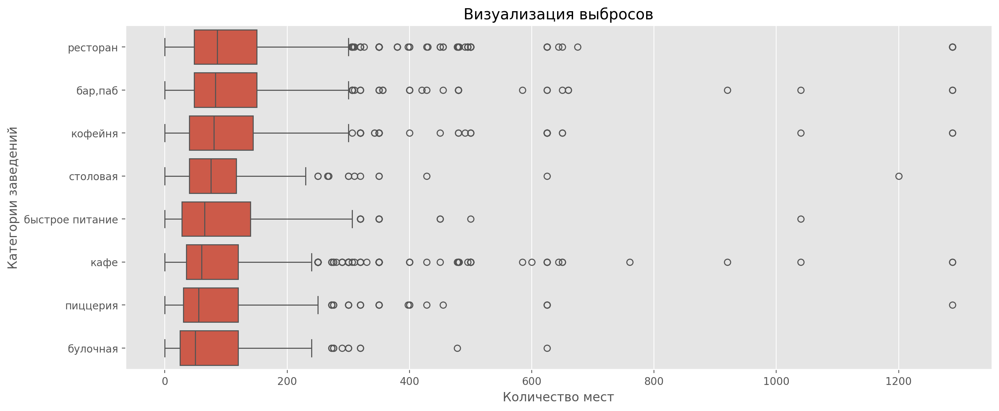

In [110]:
# группируем категории по местам и считаем медиану и сортируем в порядке убывания медианы
grouped = (df.groupby('category')['seats']
           .median()
           .sort_values(ascending=False))
# Построим "ящик с усами" для визуализации выбросов из каждой категории заведений
ax = sns.boxplot(y=df.category, x=df.seats, order=grouped.index)
ax.set_title('Визуализация выбросов')
ax.set_ylabel('Категории заведений')
ax.set_xlabel('Количество мест')
plt.show()

По графику видно, что в каждой из категорий присутствует некоторое количество выбросов. Особенно интересно наличие посадочных место более 400 в булочных, а также наличие 1288 посадочных мест для целого ряда категорий. Это может быть связано с ошибками в данных. Поэтому было принято решение использовать медианные значения количества посадочных мест в зависимости от категории заведения.

In [111]:
grouped_seats = (df.groupby('category')['seats']
                 .agg(['count', 'sum', 'mean', 'median'])
                 .reset_index()
                 .sort_values(by='sum', ascending=False))

grouped_seats

,category,count,sum,mean,median
6,ресторан,1270,154869.0,121.944094,86.0
3,кафе,1218,118770.0,97.512315,60.0
4,кофейня,751,83511.0,111.199734,80.0
0,"бар,паб",468,58281.0,124.532051,82.5
5,пиццерия,427,40350.0,94.496487,55.0
2,быстрое питание,349,34513.0,98.891117,65.0
7,столовая,164,16359.0,99.750000,75.5
1,булочная,148,13229.0,89.385135,50.0


In [112]:
fig = px.bar(grouped_seats.sort_values(by='median', ascending=True),
             x='median',
             y='category',
             text='median')
fig.update_layout(title='Количество посадочных мест по категориям заведений',
                  xaxis_title='Количество посадочных мест',
                  yaxis_title='Категории заведений',
                  title_x=0.5)
fig.show()

Как видно из графика выше, наибольшее медианное значение посадочных мест наблюдается в ресторанах (86 мест). На втором месте идут бары и пабы с 82 посадочным местом. Замыкают тройку кофейни - 80. Меньше всего посадочных мест в булочных - 50 мест. Такое распределение является логичным, так как в ресторанах, пабах и кофейнях часто посетители задерживаются на время приема пищи. Также в эти заведения могут одновременно приходить много людей, например во время ланча днем в будни, на встречи с друзьями или на свидания по вечерам и по выходным. В булочных же люди часто берут продукцию на вынос по пути домой или на работу, поэтому иметь много посадочных мест для них не является необходимым.

###  Cоотношение сетевых и несетевых заведений в датасете <a id="chain_cat"></a>

In [113]:
# Подсчитываем количество сетевых и не сетевых заведений
chain = df['chain_cat'].value_counts().reset_index()
chain

,chain_cat,count
0,не сетевая,5201
1,сетевая,3205


In [114]:
chain.rename(columns = {'chain_cat':'category'}, inplace = True)
chain

,category,count
0,не сетевая,5201
1,сетевая,3205


In [115]:
fig = px.pie(chain, values='count', names='category')

fig.update_layout(title='Cоотношение сетевых и несетевых заведений',
                 title_x=0.5,
                 legend=dict(
                     y=0.99,
                     x=0.8))

fig.show()

Как видно из диаграммы, количество не сетевых заведений почти на треть больше, чем сетевых. А именно, несетевых - 61.9%, а сетевых 38.1%.

### Категории заведений, которые чаще являются сетевыми <a id="chain"></a>

In [116]:
# Сделаем группировку по категорям, где условием выбора будут сетевые заведения(chain == 1)
is_chain = (df.query('chain == 1')
            .groupby('category', as_index=False)['name']
            .agg('count')
            .sort_values(by='name', ascending=False))
is_chain

,category,name
3,кафе,779
6,ресторан,730
4,кофейня,720
5,пиццерия,330
2,быстрое питание,232
0,"бар,паб",169
1,булочная,157
7,столовая,88


In [117]:
# Строим круговую диаграмму распределения категорий сетевых заведений
fig = px.pie(is_chain,
             values='name',
             names='category')
fig.update_layout(title='Категории сетевых заведений',
                  title_x=0.5,
                 legend=dict(
                     y=0.99,
                     x=0.8))

fig.show()

Как видно из круговой диаграммы выше в Москве чаще всего сетевыми являются кафе (24.3% от всех сетевых заведений), на втором месте рестораны (22.8% от всех сетевых заведений), а на третьем месте кофейни (22.5% от всех сетевых заведений). Это не удивительно, так как при удачной работе одного ресторана, часто следует открытие еще одного. При этом не нужно придумывать отдельные меню, оформление и т.п. Также уже есть узнаваемый бренд. То же самое касается кафе и кофеен. Кроме того, меньшие по размеру кафе и кофейни могут продавать франшизу, что также способствует увеличению сети.

In [118]:
# Группируем по категориям и сетевое/не сетевое заведения
chain_cat_grouped = (df.groupby(['category', 'chain_cat'], as_index=False)['name']
                     .agg('count')
                     .sort_values('name', ascending=False))
chain_cat_grouped

,category,chain_cat,name
6,кафе,не сетевая,1599
12,ресторан,не сетевая,1313
7,кафе,сетевая,779
13,ресторан,сетевая,730
9,кофейня,сетевая,720
8,кофейня,не сетевая,693
0,"бар,паб",не сетевая,596
4,быстрое питание,не сетевая,371
11,пиццерия,сетевая,330
10,пиццерия,не сетевая,303


In [119]:
fig = px.bar(
   chain_cat_grouped,
   x='category',
   y='name',
   color='chain_cat',
   text='name')

fig.update_layout(title='Распределение заведений по категории и сети',
                   xaxis_title='Категории заведений',
                   yaxis_title='Количество заведений',
                   title_x=0.5,
                   legend_title_text='',
                   xaxis={'categoryorder':'total descending'})

fig.show()

Из гистограммы видно, что в основном, не сетевые заведения преобладают над сетевыми. Сетевых больше только в категориях "булочные", "кофейни" и "пиццерии".

### Топ-15 популярных сетей в Москве <a id="top_15"></a>

In [120]:
# Отбираем топ-15 популярных сетей. Под популярностью понимается количество заведений этой сети в регионе
top_15 = (df.query('chain == 1')
          .groupby('name', as_index=False)['category']
          .agg('count')
          .sort_values(by='category',ascending=False)
          .head(15))
top_15.columns = ['name', 'count']
top_15

,name,count
729,шоколадница,120
335,домино'с пицца,76
331,додо пицца,74
146,one price coffee,71
742,яндекс лавка,69
58,cofix,65
168,prime,50
664,хинкальная,44
409,кофепорт,42
418,кулинарная лавка братьев караваевых,39


In [121]:
fig = px.bar(top_15.sort_values(by='count', ascending=True),
             y="name",
             x="count",
             title="Топ-15 популярных сетей в Москве",
             text='count')
fig.update_layout(
    xaxis_title='Количество заведений',
    yaxis_title='Название заведений',
    title_x=0.5)
fig.show()

Самая популярная сеть в Москве - "Шоколадница". Количество заведений этой сети в 1.5 раза превышает количество заведений "Домино'с Пицца" (76 заведений). Затем, в топ 5 входят сети "Додо Пицца", "One Price Coffe" и "Яндекс Лавка". У них по 74, 71 и 69 заведений. На 15 месте расположилась сеть "Му-Му" с 27 заведениями, что тоже довольно много.
Также, интересно заметить, что "Домино'с Пицца" и "Додо Пицца" представляют половину всех сетевых заведений в категории "пиццерии" в Москве.

#### К какой категории заведений они относятся? <a id="top_15_rest"></a>

In [122]:
# сделаем списко из топ-15 заведений для последующей отфильтровки исходного датасета
top_15_rest = top_15['name'].tolist()
top_15_rest

['шоколадница',
 "домино'с пицца",
 'додо пицца',
 'one price coffee',
 'яндекс лавка',
 'cofix',
 'prime',
 'хинкальная',
 'кофепорт',
 'кулинарная лавка братьев караваевых',
 'теремок',
 'чайхана',
 'буханка',
 'cofefest',
 'му-му']

In [123]:
# Оставляем в датасете только топ-15 сетевых заведений
filtered_top_15_rest = df.loc[df['name'].isin(top_15_rest)].copy()
filtered_top_15_rest

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,chain_cat,street,is_24_7
13,буханка,булочная,"москва, базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0,сетевая,базовская улица,False
23,буханка,булочная,"москва, лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,1,NaN,сетевая,лобненская улица,False
32,додо пицца,пиццерия,"москва, коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,NaN,Средний счёт:328 ₽,328.0,NaN,1,46.0,сетевая,коровинское шоссе,False
34,домино'с пицца,пиццерия,"москва, клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.886963,37.523518,4.2,NaN,Средний счёт:от 500 ₽,500.0,NaN,1,247.0,сетевая,клязьминская улица,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,сетевая,улица маршала федоренко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7973,теремок,ресторан,"москва, ореховый бульвар, 15",Южный административный округ,"ежедневно, 10:00–22:00",55.612758,37.720272,3.7,NaN,NaN,NaN,NaN,1,0.0,сетевая,ореховый бульвар,False
7974,хинкальная,ресторан,"москва, улица генерала белова, 23а",Южный административный округ,"ежедневно, 12:00–00:00",55.616224,37.719993,3.6,NaN,NaN,NaN,NaN,1,60.0,сетевая,улица генерала белова,False
7979,яндекс лавка,ресторан,"москва, шипиловский проезд, 65, корп. 1",Южный административный округ,"ежедневно, 07:00–00:00",55.599020,37.714239,3.5,NaN,NaN,NaN,NaN,1,75.0,сетевая,шипиловский проезд,False
7980,яндекс лавка,ресторан,"москва, улица маршала захарова, 2",Южный административный округ,"ежедневно, 07:00–00:00",55.624112,37.707183,4.0,NaN,NaN,NaN,NaN,1,200.0,сетевая,улица маршала захарова,False


In [124]:
(filtered_top_15_rest.groupby(['name', 'category'])[['category','seats', 'middle_avg_bill', 'rating']]
 .agg({'category':'count',
      'seats':'median',
      'middle_avg_bill':'median',
      'rating':'median'}))


category  seats  \
name                                category                           
cofefest                            кафе                    1    NaN   
                                    кофейня                31   60.0   
cofix                               кофейня                65   87.5   
one price coffee                    кофейня                72   99.0   
prime                               кафе                    1   60.0   
                                    ресторан               49   97.0   
буханка                             булочная               25   50.0   
                                    кафе                    1    NaN   
                                    кофейня                 6   40.0   
додо пицца                          пиццерия               74   52.0   
домино'с пицца                      пиццерия               77   40.0   
кофепорт                            кофейня                42   85.0   
кулинарная лавка братьев караваевых кафе                   39   70.0   
му-му                               бар,паб                 1  195.0   
                                    быстрое питание         2  300.0   
                                    кафе                   12  150.0   
                                    кофейня                 2  120.0   
                                    пиццерия                1  300.0   
                                    ресторан                8  135.0   
                                    столовая                1   60.0   
теремок                             быстрое питание         2  200.0   
                                    ресторан               36   87.5   
хинкальная                          бар,паб                 3   40.0   
                                    быстрое питание         6   57.0   
                                    кафе                   19   65.0   
                                    ресторан               15   60.0   
                                    столовая                1   10.0   
чайхана                             быстрое питание         2    NaN   
                                    кафе                   26   50.0   
                                    ресторан                9   58.0   
шоколадница                         кафе                    1  230.0   
                                    кофейня               119   96.0   
яндекс лавка                        ресторан               69   46.0   

                                                     middle_avg_bill  rating  
name                                category                                  
cofefest                            кафе                         NaN    4.20  
                                    кофейня                    512.5    4.00  
cofix                               кофейня                      NaN    4.10  
one price coffee                    кофейня                      NaN    4.20  
prime                               кафе                         NaN    4.20  
                                    ресторан                   300.0    4.20  
буханка                             булочная                   212.5    4.40  
                                    кафе                       300.0    4.30  
                                    кофейня                    200.0    4.35  
додо пицца                          пиццерия                   391.5    4.30  
домино'с пицца                      пиццерия                   500.0    4.20  
кофепорт                            кофейня                      NaN    4.20  
кулинарная лавка братьев караваевых кафе                       450.0    4.40  
му-му                               бар,паб                    450.0    4.30  
                                    быстрое питание            487.5    4.20  
                                    кафе                       450.0    4.30  
                                    кофейня                      NaN    4.25  
                               

In [125]:
# Построим распределение топ-15 по рейтингу
filtered_top_15_rest_rating = filtered_top_15_rest.groupby('name', as_index=False)['rating'].agg('median')

filtered_top_15_rest_rating

,name,rating
0,cofefest,4.05
1,cofix,4.10
2,one price coffee,4.20
3,prime,4.20
4,буханка,4.40
5,додо пицца,4.30
6,домино'с пицца,4.20
7,кофепорт,4.20
8,кулинарная лавка братьев караваевых,4.40
9,му-му,4.30


In [126]:
fig = px.bar(filtered_top_15_rest_rating.sort_values(by='rating', ascending=True),
             y="name",
             x="rating",
             title="Рейтинг топ-15 популярных сетей в Москве",
             text='rating')
fig.update_layout(
    xaxis_title='Рейтинг заведений',
    yaxis_title='Название заведений',
    title_x=0.5)
fig.show()

Из гистрограммы видно, что медианный рейтинг всех заведений из топ-15 находится выше 4 баллов.

In [127]:
# Выделим отдельно медианный счет, а заведения у которых нет значений счет - уберем
filtered_top_15_rest_bill = filtered_top_15_rest.groupby('name', as_index=False)['middle_avg_bill'].agg('median').dropna()
filtered_top_15_rest_bill

,name,middle_avg_bill
0,cofefest,512.5
3,prime,300.0
4,буханка,237.5
5,додо пицца,391.5
6,домино'с пицца,500.0
8,кулинарная лавка братьев караваевых,450.0
9,му-му,450.0
10,теремок,325.0
11,хинкальная,1000.0
12,чайхана,400.0


In [128]:
fig = px.bar(filtered_top_15_rest_bill.sort_values(by='middle_avg_bill', ascending=True),
             y="name",
             x="middle_avg_bill",
             title="Средний счет топ-15 популярных сетей в Москве",
             text='middle_avg_bill')
fig.update_layout(
    xaxis_title='Средний счет',
    yaxis_title='Название заведений',
    title_x=0.5)
fig.show()

Средний счет у заведений из топ-15, у которых есть данные о счете, сильно варьируется. Только одна сеть имееет средний счет равный 1000, остальные сети - ниже 1000. Что говорит о том, что наиболее популярны недорогие заведения.

In [129]:
filtered_top_15_rest_seats = filtered_top_15_rest.groupby('name', as_index=False)['seats'].agg('median').dropna()
filtered_top_15_rest_seats

,name,seats
0,cofefest,60.0
1,cofix,87.5
2,one price coffee,99.0
3,prime,96.0
4,буханка,48.0
5,додо пицца,52.0
6,домино'с пицца,40.0
7,кофепорт,85.0
8,кулинарная лавка братьев караваевых,70.0
9,му-му,155.0


In [130]:
fig = px.bar(filtered_top_15_rest_seats.sort_values(by='seats', ascending=True),
             y="name",
             x="seats",
             title="Количество посадочных мест популярных сетей в Москве",
             text='seats')
fig.update_layout(
    xaxis_title='Количество посадочных мест',
    yaxis_title='Название заведений',
    title_x=0.5)
fig.show()

Среди данных о посадочных мест встречаются подозрительные результаты. Например, медианное значение посадочных мест в сети "Му-Му" составляет 155 штук, что довольно много. То же самое для сетей "One price coffee", "Cofix", "Теремок" и "Кофепорт". Следует отметить, что часто такие заведения находятся в торговых центрах, в которых посадочные места общие на несколько разных заведений (фудкорты). Также в списке есть "Яндекс.Лавка", которая вообще не имеет своих открытых площадок, а работает только в режиме доставки еды.

### Общее количество заведений и количество заведений каждой категории по районам <a id="district"></a>

In [131]:
# Сделаем объединение по району и категории
district = (df.groupby(['district', 'category'], as_index=False)[['name']]
            .agg('count')
            #.sort_values(by='name', ascending=True)
           )
district

,district,category,name
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105
...,...,...,...
67,Южный административный округ,кафе,264
68,Южный административный округ,кофейня,131
69,Южный административный округ,пиццерия,73
70,Южный административный округ,ресторан,202


In [132]:
district_sum = (df.groupby('district', as_index=False)[['name']]
                .agg('count')
                #.sort_values(by='name', ascending=True)
               )
district_sum

,district,name
0,Восточный административный округ,798
1,Западный административный округ,851
2,Северный административный округ,900
3,Северо-Восточный административный округ,891
4,Северо-Западный административный округ,409
5,Центральный административный округ,2242
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Южный административный округ,892


In [133]:
fig = px.bar(district, x="name", y="district", color="category")

fig.update_layout(title='Количество заведений по районам Москвы',
                   xaxis_title='Количество заведений',
                   yaxis_title='Административные районы',
                   title_x=0.5,
                   legend_title_text='Категории',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.add_trace(go.Scatter(
    y=district_sum['district'],
    x=district_sum['name'],
    text=district_sum['name'],
    mode='text',
    textposition='middle right',
    textfont=dict(
        size=15,
    ),
    showlegend=False))

fig.update_xaxes(range=(0, 2500))

fig.show()

Исходя из этого графика видно, что наибольшее количество заведений всех категорий находится в Центральном административном округе, что является логичным, исходя из того, что центр Москвы является центром притяжения как для туристов и отдыхающих, так и для самих москвичей. В ЦАО значительно больше баров, пабов, ресторанов, по сравнению с другими округами Москвы (более чем в 2 раза). Также можно отметить, что рестораны в ЦОА преобладают над другими категориями заведений. Хотя, в остальных округах преобладают кафе.

Во всех остальных округах количество заведений примерно равное, за исключением СЗАО, где заведений значительно меньше. Это можно объяснить наличием нескольких больших парковых зон, водоемов, и больших промышленных зон. Согласно информации о населении Москвы по округам - в СЗАО официально проживает меньше людей, чем во всех остальных округах (за исключением ЦАО, а также не представленных в таблице ЗелАО и Новой Москвы).

### Распределение средних рейтингов по категориям заведений <a id="rating_avg"></a>

In [134]:
rating_avg = df.groupby('category', as_index=False)['rating'].agg('mean')
rating_avg['rating'] = round(rating_avg['rating'], 2)
rating_avg

,category,rating
0,"бар,паб",4.39
1,булочная,4.27
2,быстрое питание,4.05
3,кафе,4.12
4,кофейня,4.28
5,пиццерия,4.30
6,ресторан,4.29
7,столовая,4.21


In [135]:
fig = px.bar(rating_avg.sort_values(by='rating', ascending=True),
             x="rating",
             y="category",
             text='rating')
fig.update_layout(title='Рейтинг заведений по категориям',
                   xaxis_title='Средний рейтинг',
                   yaxis_title='Категории заведений',
                   title_x=0.5)
fig.show()

Из гистограммы распределения рейтинга заведений по категориям видно, что средний рейтинг не сильно различается от категории к категории и варьируется от 4.05 до 4.39. Такое распределение говорит о неплохом среднем уровне обслуживания в Москве. Но при выборе заведения для посещения лучше не учитывать обобщенный средний рейтинг по всей категории.
Наибольший рейтинг характерен для баров и пабов. Это можно объяснить общей атмосферой, которая характерна для данных заведений. Возможны случаи, когда посетители дают рейтинг, находясь в приподнятом настроении.
Категория "быстрое питание", наоборот получила наименьший рейтинг. Это можно объяснить тем, что важнее прочего в таких заведениях - скорость работы, поэтому качество обслуживания посетителя, а также вкус блюд, сервировка и т.д. будут отходить на второй план.

### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района <a id="rating_df"></a>

In [136]:
# средний рейтинг заведений каждого района
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean')
rating_df['rating'] = round(rating_df['rating'], 2)
rating_df

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [137]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data='https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson',
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

Исходя из данных фоновой картограммы видно, что наибольший рейтинг заведений общественного питания находится в центре Москвы, что не удивительно. Так как именно в центральном округе находится самое большое количество заведений. Посетителям есть из чего выбирать. Большая конкуренция приводит либо к поддержанию качества работы заведений, либо к их скорому закрытию.
Наименьший рейтинг характерен для ЮВАО. Кроме этого, для данного округа характерен и наименьший средний чек, что будет показано ниже. Это говорит о том, что заведения в этом округе меньше следят за качеством работы, возможно из-за менее платежеспособного населения, проживающего в этом округе (известно, что данный округ Москвы считается наименее благоприятным для жизни, и недвижимость здесь стоит дешевле, что связано с густонаселенностью, плохой экологией, не самой хорошей криминогенной обстановкой).

#### Все заведения датасета на карте с помощью кластеров <a id="map"></a>

In [138]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

marker_cluster = MarkerCluster().add_to(m)
def cluster(row):
  Marker([row['lat'], row['lng']],
         popup=f'{row["name"]} {row["rating"]}').add_to(marker_cluster)

df.apply(cluster, axis=1)
m

Как видно из отображения заведений на карте при помощи кластеров, основная масса заведений общественного питания сконцентрирована в центре Москвы. Также, достаточно много заведений расположены рядом друг с другом в торговых центрах.

### Топ-15 улиц по количеству заведений. <a id="street_all"></a>

In [139]:
# группировка и отбор топ-15 улиц по количеству заведений
street_all = (df.groupby('street', as_index=False)['name']
              .agg('count')
              .sort_values(by='name', ascending=False))

street_top_15 = street_all.head(15)
street_top_15

,street,name
837,проспект мира,184
841,профсоюзная улица,122
834,проспект вернадского,108
533,ленинский проспект,107
531,ленинградский проспект,95
379,дмитровское шоссе,88
461,каширское шоссе,77
304,варшавское шоссе,76
532,ленинградское шоссе,70
610,мкад,65


In [140]:
# для использования улиц в качестве фильтра для датасета преображаю их в список
streets = street_top_15['street'].to_list()

In [141]:
# фильтруем наш датасет
df_top_15_streets = df.loc[df['street'].isin(streets)].copy()
df_top_15_streets

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,chain_cat,street,is_24_7
8,donna maria,ресторан,"москва, дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,не сетевая,дмитровское шоссе,False
12,заправка,кафе,"москва, мкад, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,0,NaN,не сетевая,мкад,False
17,чайхана беш-бармак,ресторан,"москва, ленинградское шоссе, 71б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,не сетевая,ленинградское шоссе,True
26,пикочино,пиццерия,"москва, дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,900.0,NaN,0,NaN,не сетевая,дмитровское шоссе,False
28,mafe,кафе,"москва, мкад, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,NaN,не сетевая,мкад,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,назис пури,кофейня,"москва, люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN,не сетевая,люблинская улица,False
8396,пекинский двор,ресторан,"москва, ленинский проспект, 158",Западный административный округ,"ежедневно, 11:00–23:00",55.651706,37.482667,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,200.0,не сетевая,ленинский проспект,False
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,не сетевая,профсоюзная улица,False
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,не сетевая,люблинская улица,True


In [142]:
# группируем данные по улице и категории для подсчета количества категорий заведений на улицах
df_top_15_streets_grouped = df_top_15_streets.groupby(['street', 'category'])['name'].agg(['count']).reset_index()
df_top_15_streets_grouped

,street,category,count
0,варшавское шоссе,"бар,паб",6
1,варшавское шоссе,быстрое питание,7
2,варшавское шоссе,кафе,18
3,варшавское шоссе,кофейня,14
4,варшавское шоссе,пиццерия,4
...,...,...,...
106,улица миклухо-маклая,быстрое питание,4
107,улица миклухо-маклая,кафе,21
108,улица миклухо-маклая,кофейня,4
109,улица миклухо-маклая,пиццерия,2


In [143]:
# Строим гистрограмму распределения категорий заведений по расположению на улицах из топ-15
fig = px.bar(df_top_15_streets_grouped.sort_values(by='count', ascending=False),
             x="count",
             y="street",
             color="category")
fig.update_layout(title='Количество заведений по улицам Москвы',
                  xaxis_title='Количество заведений',
                  yaxis_title='Улицы',
                  title_x=0.5,
                  legend_title_text='Категории',
                  yaxis={'categoryorder':'total ascending'}
                 )
fig.add_trace(go.Scatter(
    y=street_top_15['street'],
    x=street_top_15['name'],
    text=street_top_15['name'],
    mode='text',
    textposition='middle right',
    textfont=dict(
        size=15,
    ),
    showlegend=False))


fig.show()

Как видно из гистрограммы, наибольшее количество заведений находятся на больших протяженных улицах, проспектах и шоссе. Представлены многие радиальные улицы и шоссе, отходящие от центра города.
Наибольшее количество заведений находится на улице Мира - 184 шт. На этой улице много ресторанов, кофеен и кафе. На втором месте - Профсоюзная улица, что не удивительно, так как это самая протяженная улица Москвы. Интересная закономерность касается МКАД. При общем количестве заведений равным 65 количество заведений категории "кафе" там составляет 45, что всего на 8 шт. меньше, чем на проспекте Мира. Количество пиццерий больше всего на Профсоюзной улице. Больше всего баров и пабов на Ленинградском проспекте.
Для не самых протяженных улиц, например Вавилова, большое количество заведений связано с их концентрацией в одном месте (крупный ТЦ Гагаринский, Черемушкинский рынок).

#### Категории цен в заведениях на топ-15 улицах <a id="df_top_15_streets_price"></a>

In [144]:
# Посмотрим на категорию цен в заведениях на топ-15 улицах
df_top_15_streets_price = df_top_15_streets.groupby('price', as_index=False)['name'].count()
df_top_15_streets_price['name'].sum()
df_top_15_streets_price['percent'] = df_top_15_streets_price['name'] / df_top_15_streets_price['name'].sum()
df_top_15_streets_price

,price,name,percent
0,высокие,72,0.150313
1,выше среднего,85,0.177453
2,низкие,22,0.045929
3,средние,300,0.626305


In [145]:
# Построим диаграмму
fig = px.pie(df_top_15_streets_price, values='percent', names='price')
fig.update_layout(title='Категория цен в заведениях',
                  title_x=0.5,
                 legend=dict(
                     y=0.99,
                     x=0.8))

fig.show()

Как видно из диаграммы 62.6% заведений на топ-15 улицах имеют средний уровень цен.

### Улицы, на которых находится только один объект общепита <a id="street_catering_one"></a>

In [146]:
# выведем улицы, где количество заведений равно 1
street_catering_one = street_all[street_all['name'] == 1]
street_catering_one

,street,name
1401,челюскинская улица,1
1,1-й балтийский переулок,1
6,1-й грайвороновский проезд,1
1438,яковоапостольский переулок,1
1437,якиманский переулок,1
...,...,...
7,1-й дербеневский переулок,1
10,1-й капотнинский проезд,1
11,1-й кирпичный переулок,1
12,1-й колобовский переулок,1


In [147]:
# преобразовываем в список
street_catering_one_name = street_catering_one['street'].to_list()
street_catering_one_name[:5]

['челюскинская улица',
 '1-й балтийский переулок',
 '1-й грайвороновский проезд',
 'яковоапостольский переулок',
 'якиманский переулок']

In [148]:
street_catering_one_df = df.loc[df['street'].isin(street_catering_one_name)]
street_catering_one_df.sample(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,chain_cat,street,is_24_7
4267,калитки,кофейня,"москва, большой николопесковский переулок, 5",Центральный административный округ,"пн-пт 09:00–21:00; сб,вс 10:00–21:00",55.750053,37.590478,4.1,средние,Средний счёт:500 ₽,500.0,NaN,1,16.0,сетевая,большой николопесковский переулок,False
4934,coffeewinner,кофейня,"москва, краснохолмская набережная, 13с1",Центральный административный округ,"ежедневно, 10:00–22:00",55.734411,37.652532,4.3,NaN,NaN,NaN,NaN,0,NaN,не сетевая,краснохолмская набережная,False
3962,"бар, паб проточный","бар,паб","москва, проточный переулок, 2/1",Центральный административный округ,пн-чт 12:00–00:00; пт 12:00–02:00; сб 10:00–01...,55.750487,37.582043,4.6,NaN,NaN,NaN,NaN,0,NaN,не сетевая,проточный переулок,False
3379,vegolife,"бар,паб","москва, зоологическая улица, 4",Центральный административный округ,"пн-пт 08:30–20:00; сб,вс 10:00–18:00",55.765204,37.580766,5.0,NaN,NaN,NaN,NaN,0,NaN,не сетевая,зоологическая улица,False
3454,bbcafe,ресторан,"москва, скатертный переулок, 13",Центральный административный округ,"ежедневно, 07:30–00:00",55.755926,37.594484,4.6,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,0,75.0,не сетевая,скатертный переулок,False
7820,coffeplet,кафе,"москва, липецкая улица (дублёр)",Южный административный округ,вт-вс 10:00–20:00,55.592881,37.672531,3.9,NaN,NaN,NaN,NaN,0,NaN,не сетевая,липецкая улица (дублёр),False
2262,монастырская трапеза,кафе,"москва, третье транспортное кольцо",Центральный административный округ,"ежедневно, 09:00–20:00",55.784341,37.665506,4.2,NaN,NaN,NaN,NaN,1,NaN,сетевая,третье транспортное кольцо,False
3944,александр,кафе,"москва, нащокинский переулок, 14",Центральный административный округ,"ежедневно, 11:00–23:00",55.746463,37.598274,4.7,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,NaN,не сетевая,нащокинский переулок,False
434,кафе 11/11,ресторан,"москва, 3-й лихачёвский переулок, 11/11",Северный административный округ,"ежедневно, 11:00–23:00",55.848994,37.520525,4.2,средние,Средний счёт:500–1000 ₽,750.0,NaN,0,NaN,не сетевая,3-й лихачёвский переулок,False
4390,кофепровод,кофейня,"москва, яковоапостольский переулок, 9с1",Центральный административный округ,"пн-пт 08:30–21:00; сб,вс 10:00–20:00",55.758703,37.654258,4.4,средние,Цена чашки капучино:200–250 ₽,NaN,225.0,0,NaN,не сетевая,яковоапостольский переулок,False


In [149]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

marker_cluster = MarkerCluster().add_to(m)
def cluster(row):
  Marker([row['lat'], row['lng']],
         popup=f'{row["name"]} {row["rating"]}').add_to(marker_cluster)

street_catering_one_df.apply(cluster, axis=1)
m

У всех таких улиц есть одна общая черта - это небольшие по протяженности улицы. Часто, представляющие собой проезды или переулки, внутри жилой застройки. А также единичные заведения есть в парках.

In [150]:
# Посмотрим на категорию цен в заведениях на таких улицах
street_catering_one_df_price = street_catering_one_df.groupby('price', as_index=False)['name'].count()
street_catering_one_df_price['name'].sum()
street_catering_one_df_price['percent'] = street_catering_one_df_price['name'] / street_catering_one_df_price['name'].sum()
street_catering_one_df_price

,price,name,percent
0,высокие,22,0.120879
1,выше среднего,29,0.159341
2,низкие,11,0.060440
3,средние,120,0.659341


In [151]:
fig = px.pie(street_catering_one_df_price, values='percent', names='price')

fig.update_layout(title='Категория цен в заведениях',
                  title_x=0.5,
                 legend=dict(
                     y=0.99,
                     x=0.8))

fig.show()

Как видно из диаграммы, цены в заведениях на таких улицах не отличаются от тех, что находятся на улицах из топ-15. Цены средние в 65.9%  случаях, что на 3% больше, чем на улицах из топ-15. Но это можно списать на меньшую выборку.

### Медиана значений средних чеков заведений для каждого района <a id="median_bill_district"></a>

In [152]:
# группируем по районам и считаем медиану
median_bill_district = df.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
median_bill_district

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [153]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data='https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson',
    data=median_bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Медианный чек в заведениях по районам',
).add_to(m)
m

Наибольшие медианные чеки в заведениях наблюдаются в ЦАО и ЗАО. ЦАО - центральная часть города с наибольшим количеством разнообразных заведений, в том числе наиболее дорогих. Там всегда много туристов, а также престижность района привлекает множество людей. ЗАО также является одним из наиболее престижных районом Москвы. Тут расположено множество дорогих ЖК и закрытых поселков. Так как у людей, живущих в этом районе, есть деньги, то они могут оставлять большие суммы в заведениях общественного питания. СЗАО и САО имеют второй по величине медианный чек. Затем идут ВАО и ЮЗАО. Тут множество спальных районов с достаточно высокой стоимостью жилья. Но проживание в этих районах менее престижно, чем в ЦАО и ЗАО. Самый небольшой чек в ЮВАО, ЮАО и СВАО. Заведения в ЮВАО, СВАО и ЮАО имеют меньший чек в связи с менее престижным местом проживания. Они характеризуются меньшей стоимостью квадратного метра, поэтому люди, покупающие или снимающие квартиры в этом районе имеют средний или небольшой достаток, что сказывается на возможности тратить деньги в заведениях питания.

### Анализ заведений, работающих 24 часа <a id="df_24_7"></a>

In [154]:
# выведем 5 случайных записей датасета
df.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,chain_cat,street,is_24_7
7,mr. уголёк,быстрое питание,"москва, клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,не сетевая,клязьминская улица,False
4858,тай-чай,ресторан,"москва, таганская улица, 3",Центральный административный округ,"ежедневно, 10:00–00:00",55.741306,37.658721,4.2,средние,Средний счёт:700–800 ₽,750.0,NaN,0,170.0,не сетевая,таганская улица,False
6753,pho viet,ресторан,"москва, ленинский проспект, 108с1",Западный административный округ,"ежедневно, 10:00–23:00",55.669679,37.512383,4.2,NaN,Средний счёт:350–700 ₽,525.0,NaN,1,NaN,сетевая,ленинский проспект,False
8068,брускетта и...,ресторан,"москва, улица архитектора щусева, 2к1",Южный административный округ,"ежедневно, 11:00–23:00",55.699747,37.634773,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,NaN,не сетевая,улица архитектора щусева,False
7236,фо стрит,ресторан,"москва, каширское шоссе, 3, корп. 2, стр. 4",Южный административный округ,пн-пт 09:00–20:00; сб 12:00–18:00,55.672488,37.631460,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,40.0,не сетевая,каширское шоссе,False


In [155]:
# Выведем заведения, работающие 24 часа
df_24_7 = df.query('is_24_7 == True')

In [156]:
# Сгруппируем по категориям и выясним количество сетевых заведений и медианные значения посадочных мест
df_24_7_chain = df_24_7.groupby('category', as_index=False)[['chain', 'seats']].agg({'chain':'sum',
                                                                                     'seats':'median'})
df_24_7_chain

,category,chain,seats
0,"бар,паб",10,96.0
1,булочная,6,87.0
2,быстрое питание,54,45.0
3,кафе,115,50.0
4,кофейня,50,78.0
5,пиццерия,16,45.0
6,ресторан,56,80.0
7,столовая,6,50.0


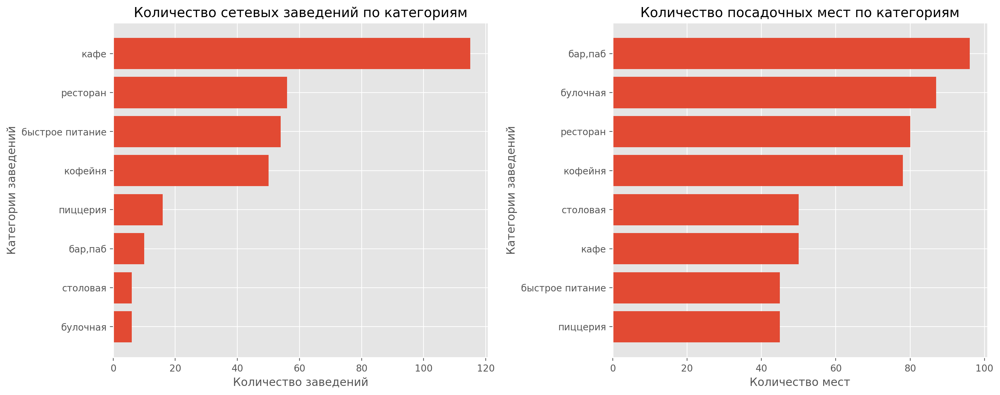

In [157]:
# Построим графики
fig, axs = plt.subplots(1,2)
df_24_7_chain = df_24_7_chain.sort_values(by=['chain'])

axs[0].barh(width=df_24_7_chain['chain'], y=df_24_7_chain['category'])

df_24_7_chain = df_24_7_chain.sort_values(by=['seats'])
axs[1].barh(width=df_24_7_chain['seats'], y=df_24_7_chain['category'])

axs[0].set_title('Количество сетевых заведений по категориям')
axs[1].set_title('Количество посадочных мест по категориям')

axs[0].set_xlabel('Количество заведений')
axs[0].set_ylabel('Категории заведений')
axs[1].set_xlabel('Количество мест')
axs[1].set_ylabel('Категории заведений')

plt.tight_layout()
fig.show()

Из графиков выше видно, что кафе - это наиболее часто встречающиеся сетевые заведения, работающие по 24 часа в сутки (115 штук). Затем, с большим отрывом идут рестораны (56), заведения быстрого питания (54) и кофейни (50). Реже всего 24/7 работают булочные и столовые.
При этом, посадочных мест больше в барах и пабах (96), ресторанах (80), кофейнях (78) и в булочных (87). Большое количество мест в булочных можно объяснить малой выборкой, а также ошибкой в данных. Меньше всего посадочных мест в пиццериях и местах быстрого питания - по 45 мест.

### Заведения с плохим рейтингом <a id="bad_rating"></a>

In [158]:
# Примем за заведения с плохим рейтингом рейтинг меньше 4
bad_rating = df.query('rating < 4')
bad_rating

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,chain_cat,street,is_24_7
28,mafe,кафе,"москва, мкад, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,NaN,не сетевая,мкад,False
36,пекарня № 1 грузинская кухня,кафе,"москва, коровинское шоссе, 33а",Северный административный округ,"ежедневно, 10:00–22:00",55.882222,37.518057,3.9,NaN,NaN,NaN,NaN,0,21.0,не сетевая,коровинское шоссе,False
37,халяль закусочная,кафе,"москва, коровинское шоссе, 46, стр. 5",Северный административный округ,"ежедневно, 08:00–23:00",55.888023,37.515443,3.9,NaN,NaN,NaN,NaN,0,NaN,не сетевая,коровинское шоссе,False
40,кафе,кафе,"москва, ижорская улица, 18, стр. 1",Северный административный округ,NaN,55.895115,37.524902,3.7,NaN,NaN,NaN,NaN,0,NaN,не сетевая,ижорская улица,NaN
42,варня кафе,быстрое питание,"москва, коровинское шоссе, 29, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.880010,37.520204,3.8,NaN,NaN,NaN,NaN,0,46.0,не сетевая,коровинское шоссе,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8391,кафе кенч,кафе,"москва, 1-я новокузьминская улица, 3",Юго-Восточный административный округ,"ежедневно, 11:00–00:00",55.716771,37.785316,2.8,NaN,NaN,NaN,NaN,0,45.0,не сетевая,1-я новокузьминская улица,False
8392,касабланка,кафе,"москва, большая косинская улица, 27",Восточный административный округ,пн-чт 08:00–17:00; пт 08:00–16:00,55.718514,37.857576,3.3,NaN,NaN,NaN,NaN,0,NaN,не сетевая,большая косинская улица,False
8395,истира запрафка,кафе,"москва, юго-восточный административный округ, ...",Юго-Восточный административный округ,NaN,55.724686,37.710558,2.9,NaN,NaN,NaN,NaN,0,NaN,не сетевая,юго-восточный административный округ,NaN
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,не сетевая,люблинская улица,True


In [159]:
bad_rating_district = bad_rating.groupby('district', as_index=False)[['rating', "middle_avg_bill"]].agg('median')
bad_rating_district

,district,rating,middle_avg_bill
0,Восточный административный округ,3.6,335.0
1,Западный административный округ,3.7,417.5
2,Северный административный округ,3.7,400.0
3,Северо-Восточный административный округ,3.6,400.0
4,Северо-Западный административный округ,3.6,300.0
5,Центральный административный округ,3.7,587.5
6,Юго-Восточный административный округ,3.5,300.0
7,Юго-Западный административный округ,3.6,350.0
8,Южный административный округ,3.6,387.5


In [160]:
# посмотрим их расположение по округам

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data='https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson',
    data=bad_rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Рейтинг по округам',
).add_to(m)
m

Картина схожа с усредненным рейтингом, что была выше. Наибольший рейтинг из группы заведений с плохим рейтингом имеют заведения, которые находятся в центре, в ЗАО и САО. А наименьший в ЮВАО. Таким образом, если ищете заведения, где можно хорошо поесть, то лучше искать их в ЦАО, ЗАО и САО. Зато уровень цен в таких заведениях не превышает 600р.

### Промежуточный вывод <a id="conclusion_of analysis"></a>

Ниже представлен вывод по разделу "Анализ данных".
1. Исследование количества объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее.
В г. Москва наибольшее количество заведений общественного питания относятся к категории "кафе" с количеством 2378 штук. На втором месте по популярности - "рестораны" с количеством 2043 штуки. На третьем месте - кофейни (1413 шт). Затем идет категория "бар/паб" с количеством почти в 2 раза меньше, чем кофеен - 765 шт. Следом расположились категории "пиццерия" (633), заведения "быстрого питания" (603), "столовые" (315). На последнем месте по количеству - "булочные" (256 шт).
2. Исследование зависимости количества посадочных мест в зависимости от категории заведения.
Наибольшее медианное значение посадочных мест наблюдается в ресторанах (86 мест). На втором месте идут бары и пабы с 82 посадочным местом. Замыкают тройку кофейни - 80. Меньше всего посадочных мест в булочных - 50 мест. Такое распределение является логичным, так как в ресторанах, пабах и кофейнях часто посетители задерживаются на время приема пищи. Также в эти заведения могут одновременно приходить много людей, например во время ланча днем в будни, на встречи с друзьями или на свидания по вечерам и по выходным. В булочных же люди часто берут продукцию на вынос по пути домой или на работу, поэтому иметь много посадочных мест для них не является необходимым.
3. Cоотношение сетевых и несетевых заведений.
Количество не сетевых заведений почти на треть больше, чем сетевых. А именно, несетевых - 61.9%, а сетевых 38.1%. Что объясняется тем, что сетевыми становятся заведения уже имеющие немалый коммерческий успех. Одновременно, каждый год открываются и закрываются множество заведений, владельцы которых только начинают путь в этом бизнесе.
4.  Категории заведений, которые чаще являются сетевыми.
В Москве чаще всего сетевыми являются кафе (24.3% от всех сетевых заведений), на втором месте рестораны (22.8% от всех сетевых заведений), а на третьем месте кофейни (22.5% от всех сетевых заведений). Это не удивительно, так как при удачной работе одного ресторана, часто следует открытие еще одного. При этом не нужно придумывать отдельные меню, оформление и т.п. Также уже есть узнаваемый бренд. То же самое касается кафе и кофеен. Кроме того, меньшие по размеру кафе и кофейни могут продавать франшизу, что также способствует увеличению сети. Количество не сетевых заведений преобладают над сетевыми. Сетевых больше только в категориях "булочные", "кофейни" и "пиццерии".
5. Топ-15 популярных сетей в Москве.
Самая популярная сеть в Москве - "Шоколадница". Количество заведений этой сети в 1.5 раза превышает количество заведений "Домино'с Пицца" (76 заведений). Затем, в топ 5 входят сети "Додо Пицца", "One Price Coffe" и "Яндекс Лавка". У них по 74, 71 и 69 заведений. На 15 месте расположилась сеть "Му-Му" с 27 заведениями, что тоже довольно много.
Также, интересно заметить, что "Домино'с Пицца" и "Додо Пицца" представляют половину всех сетевых заведений в категории "пиццерии" в Москве.
- Среди данных о посадочных местах встречаются подозрительные результаты. Например, медианное значение посадочных мест в сети "Му-Му" составляет 155 штук, что довольно много. То же самое для сетей "One price coffee", "Cofix", "Теремок" и "Кофепорт". Следует отметить, что часто такие заведения находятся в торговых центрах, в которых посадочные места общие на несколько разных заведений (фудкорты). Также в списке есть "Яндекс.Лавка", которая вообще не имеет своих открытых площадок, а работает только в режиме доставки еды.
6. Общее количество заведений и количество заведений каждой категории по районам.
Наибольшее количество заведений всех категорий находится в Центральном административном округе, что является логичным, исходя из того, что центр Москвы является центром притяжения как для туристов и отдыхающих, так и для самих москвичей. В ЦАО значительно болльше баров, пабов, ресторанов, по сравнению с другими округами Москвы (более чем в 2 раза).
Во всех остальных округах количество заведений примерно равное, за исключением СЗАО, где заведений значительно меньше. Это можно объяснить наличием нескольких больших парковых зон, водоемов, и больших промышленных зон. Согласно информации о населении Москвы по округам - в СЗАО официально проживает меньше людей, чем во всех остальных округах (за исключением ЦАО, а также не представленных в таблице ЗелАО и Новой Москвы).
7. Распределение средних рейтингов по категориям заведений.
Средний рейтинг не сильно различается от категории к категории и варьируется от 4.05 до 4.39. Такое распределение говорит о неплохом среднем уровне обслуживания в Москве. Но при выборе заведения для посещения лучше не учитывать обобщенный средний рейтинг по всем категориям.
Наибольший рейтинг характерен для баров и пабов. Это можно объяснить общей атмосферой, которая характерна для данных заведений. Возможны случаи, когда посетители дают рейтинг, находясь в приподнятом настроении.
Категория "быстрое питание", наоборот получила наименьший рейтинг. Это можно объяснить тем, что важнее прочего в таких заведениях - скорость работы, поэтому качество обслуживания посетителя, а также вкус блюд, сервировка и т.д. будут отходить на второй план.
8. Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района.
Исходя из данных фоновой картограммы видно, что наибольший рейтинг заведений общественного питания находится в центре Москвы, что не удивительно. Так как именно в центральном округе находится самое большое количество заведений. Посетителям есть из чего выбирать. Большая конкуренция приводит либо к поддержанию качества работы заведений, либо к их скорому закрытию.
Наименьший рейтинг характерен для ЮВАО. Кроме этого, для данного округа характерен и наименьший средний чек. Это говорит о том, что заведения в этом округе меньше следят за качеством работы, возможно из-за менее платежеспособного населения, проживающего в этом округе (известно, что данный округ Москвы считается наименее благоприятным для жизни, и недвижимость здесь стоит дешевле, что связано с густонаселенностью, плохой экологией, не самой хорошей криминогенной обстановкой). Как видно из отображения заведений на карте при помощи кластеров, основная масса заведений общественного питания сконцентрирована в центре Москвы. Также, достаточно много заведений расположены рядом друг с другом в торговых центрах.
9. Топ-15 улиц по количеству заведений.
Наибольшее количество заведений находятся на больших протяженных улицах, проспектах и шоссе. Представлены многие радиальные улицы и шоссе, отходящие от центра города.
Наибольшее количество заведений находится на улице Мира - 184 шт. На этой улице много ресторанов, кофеен и кафе. На втором месте - Профсоюзная улица, что не удивительно, так как это самая протяженная улица Москвы. Интересная закономерность касается МКАД. При общем количестве заведений равным 65 количество заведений категории "кафе" там составляет 45, что всего на 8 шт. меньше, чем на проспекте Мира. Количество пиццерий больше всего на Профсоюзной улице. Больше всего баров и пабов на Ленинградском проспекте.
Для не самых протяженных улиц, например Вавилова, большое количество заведений связано с их концентрацией в одном месте (крупный ТЦ Гагаринский, Черемушкинский рынок). 62.6% заведений на топ-15 улицах имеют средний уровень цен.
10. Улицы, на которых находится только один объект общепита.
У всех таких улиц есть одна общая черта - это небольшие по протяженности улицы. Часто, представляющие собой проезды или переулки, внутри жилой застройки. А также единичные заведения есть в парках. Цены в заведениях на таких улицах не отличаются от тех, что находятся на улицах из топ-15. Цены средние в 65.9%  случаях, что на 3% больше, чем на улицах из топ-15. Но это можно списать на меньшую выборку.
11. Медиана значений средних чеков заведений для каждого района.
Наибольшие медианные чеки в заведениях наблюдаются в ЦАО и ЗАО. ЦАО - центральная часть города с наибольшим количеством разнообразных заведений, в том числе наиболее дорогих. Там всегда много туристов, а также престижность района привлекает множество людей. ЗАО также является одним из наиболее престижных районом Москвы. Тут расположено множество дорогих ЖК и закрытых поселков. Так как у людей, живущих в этом районе, есть деньги, то они могут оставлять большие суммы в заведениях общественного питания. СЗАО и САО имеют второй по величине медианный чек. Затем идут ВАО и ЮЗАО. Тут множество спальных районов с достаточно высокой стоимостью жилья. Но проживание в этих районах менее престижно, чем в ЦАО и ЗАО. Самый небольшой чек в ЮВАО, ЮАО и СВАО. Заведения в ЮВАО, СВАО и ЮАО имеют меньший чек в связи с менее престижным местом проживания. Они характеризуются меньшей стоимостью квадратного метра, поэтому люди, покупающие или снимающие квартиры в этом районе имеют средний или небольшой достаток, что сказывается на возможности тратить деньги в заведениях питания.
12. Анализ заведений, работающих 24 часа.
Согласно проведенному анализу, кафе - это наиболее часто встречающиеся сетевые заведения, работающие по 24 часа в сутки (115 штук). Затем, с большим отрывом идут рестораны (56), заведения быстрого питания (54) и кофейни (50). Реже всего 24/7 работают булочные и столовые.
При этом, посадочных мест больше в барах и пабах (96), ресторанах (80), кофейнях (78) и в булочных (87). Большое количество мест в булочных можно объяснить малой выборкой, а также ошибкой в данных. Меньше всего посадочных мест в пиццериях и местах быстрого питания - по 45 мест.
13. Заведения с плохим рейтингом (< 4).
Картина схожа с усредненным рейтингом, что была выше. Наибольший рейтинг из группы заведений с плохим рейтингом имеют заведения, которые находятся в центре, в ЗАО и САО. А наименьший в ЮВАО. Таким образом, если ищете заведения, где можно хорошо поесть, то лучше искать их в ЦАО, ЗАО и САО. Зато уровень цен в заведениях с таким рейтингом не превышает 600р.

## Открытие кофейни <a id="coffee"></a>

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.
Ответьте на следующие вопросы:
1. Сколько всего кофеен в датасете?
2. В каких районах их больше всего, каковы особенности их расположения?
3. Есть ли круглосуточные кофейни?
4. Какие у кофеен рейтинги? Как они распределяются по районам?
5. На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

### Сколько всего кофеен в датасете? <a id="coffee_house_df"></a>

In [161]:
df.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,chain_cat,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,не сетевая,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,не сетевая,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,не сетевая,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,не сетевая,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,сетевая,правобережная улица,False


In [162]:
# Посмотрим общее описание датасета при выборке кофеен
coffee_house_df = df.query('category == "кофейня"').copy()
coffee_house_df[['rating', 'middle_avg_bill', 'middle_coffee_cup', 'seats']].describe()

,rating,middle_avg_bill,middle_coffee_cup,seats
count,1413.000000,200.000000,521.000000,751.000000
mean,4.277282,614.210000,175.055662,111.199734
std,0.372250,501.083154,89.753009,127.837772
min,1.400000,0.000000,60.000000,0.000000
25%,4.100000,300.000000,124.000000,40.000000
50%,4.300000,400.000000,170.000000,80.000000
75%,4.400000,750.000000,225.000000,144.000000
max,5.000000,2500.000000,1568.000000,1288.000000


In [163]:
# находим количество кофеен и общее количество заведений. Построим диаграмму, чтобы посмотреть распределение
coffee_house = len(df.query('category == "кофейня"'))
all_catering = len(df) - len(df.query('category == "кофейня"'))

colors = ['gold', 'mediumturquoise']
fig = go.Figure(data=[go.Pie(labels=['Кофейни', 'Прочие заведения'],
                             values=[coffee_house, all_catering])])
fig.update_traces(hoverinfo='label+value', textinfo='percent', textfont_size=20,
                  marker=dict(colors=colors, line=dict(color='#000000', width=2)))

fig.update_layout(title='Доля кофеен',
                  title_x=0.5,
                  title_y=0.87,
                 legend=dict(
                     y=0.99,
                     x=0.8))

fig.show()

Всего кофеен в датасете 1413. Это составляет 16.8% от всех заведений города Москвы.

### В каких районах их больше всего, каковы особенности их расположения? <a id="coffee_house_district"></a>

In [164]:
coffee_house_district = coffee_house_df.groupby('district', as_index=False)['name'].agg('count')

In [165]:
# Карта распределений кофеен по районам
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data='https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson',
    data=coffee_house_district,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Распределение кофеен по районам',
).add_to(m)

m

In [166]:
# Построим гистрограмму распределения кофеен по районам
fig = px.bar(coffee_house_district.sort_values(by='name', ascending=True),
             x="name",
             y="district",
             text='name')
fig.update_layout(title='Количество кофеен по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Административные районы',
                   title_x=0.5)
fig.show()

Исходя из данных анализа расположения кофеен, наибольшее их количество встречается в ЦАО - 428 шт. Затем с большим отрывом идет САО - 193 шт. Всех меньше кофеен в СЗАО, там их всего 62 штуки.

In [167]:
coffee_house_street = (coffee_house_df.groupby('street', as_index=False)['name']
                .agg('count')
                .sort_values(by='name', ascending=False))
coffee_house_street_many = coffee_house_street.query('name >= 10')
coffee_house_street_many

,street,name
360,проспект мира,36
216,ленинградский проспект,25
218,ленинский проспект,23
362,профсоюзная улица,18
358,проспект вернадского,16
181,каширское шоссе,16
123,варшавское шоссе,14
217,ленинградское шоссе,13
290,новослободская улица,13
210,кутузовский проспект,13


In [168]:
# Построим гистрограмму распределения кофеен, которых >= 10 на одной улице
fig = px.bar(coffee_house_street_many.sort_values(by='name', ascending=True),
             x="name",
             y="street",
             text='name')
fig.update_layout(title='Количество кофеен на улицах',
                   xaxis_title='Количество заведений',
                   yaxis_title='Улицы Москвы',
                   title_x=0.5)
fig.show()

Больше всего кофеен на проспекте Мира (36), затем идут Ленинградский проспект (25) и Ленинский проспект (23). Замыкают группу лидеров - улица Вавилова (10) и Дмитровское шоссе с Люблинской улицей по 11 заведений. То есть, больше всего заведений на длинных улицах, проспектах, а также там, где есть крупные ТЦ.

### Есть ли круглосуточные кофейни? <a id="coffee_house_24_7"></a>

In [169]:
colors = ['gold', 'mediumturquoise']
fig = go.Figure(data=[go.Pie(labels=['Открыты 24/7', 'Работают по расписанию'],
                             values=[len(coffee_house_df.query('is_24_7 == True')),
                                     len(coffee_house_df) - len(coffee_house_df.query('is_24_7 == True'))])])

fig.update_layout(title='Доля круглосуточных кофеен',
                  title_x=0.5,
                  title_y=0.87,
                 legend=dict(
                     y=0.99,
                     x=0.8))

fig.update_traces(hoverinfo='label+value', textinfo='percent', textfont_size=20,
                  marker=dict(colors=colors, line=dict(color='#000000', width=2)))
fig.show()

Всего 4.2% всех кофеен работают круглосуточно.

### Какие у кофеен рейтинги? Как они распределяются по районам? <a id="coffee_house_rating"></a>

In [170]:
# средний рейтинг кофеен каждого района
coffee_house_rating = coffee_house_df.groupby('district', as_index=False)['rating'].agg('mean')
coffee_house_rating['rating'] = round(rating_df['rating'], 2)
coffee_house_rating

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [171]:
# Строим картограмму распределения рейтинга по районам
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data='https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson',
    data=coffee_house_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',

).add_to(m)

m

У всех кофеен в Москве средний рейтинг достаточно высокий и варьируется от 4.10 до 4.4. Наибольший рейтинг в ЦАО. Это логично, так как в ЦАО высокая конкуренция и наиболее платежеспособные посетители. Поэтому кофейни с плохим обслуживанием не смогут конкурировать и закроются.

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему? <a id="coffee_house_coffee_price"></a>

In [172]:
coffee_house_df.middle_coffee_cup.median()

170.0

In [173]:
# Группируем по району и считаем медианную стоимость чашки кофе
coffee_house_coffee_price = coffee_house_df.groupby('district', as_index=False)['middle_coffee_cup'].agg('median')
coffee_house_coffee_price

,district,middle_coffee_cup
0,Восточный административный округ,135.0
1,Западный административный округ,189.0
2,Северный административный округ,159.0
3,Северо-Восточный административный округ,162.5
4,Северо-Западный административный округ,165.0
5,Центральный административный округ,190.0
6,Юго-Восточный административный округ,147.5
7,Юго-Западный административный округ,198.0
8,Южный административный округ,150.0


In [174]:
# Построим гистрограмму растпределения стоимости чашки кофе в зависимости от района
fig = px.bar(coffee_house_coffee_price.sort_values(by='middle_coffee_cup', ascending=True),
             x="middle_coffee_cup",
             y="district",
             text='middle_coffee_cup')
fig.update_layout(title='Стоимость чашки кофе в зависсимости от района',
                   xaxis_title='Стоимость чашки кофе',
                   yaxis_title='Районы Москвы',
                   title_x=0.5)
fig.show()

Наиболее дорогой чашка кофе оказалась в ЮЗАО - 198 рублей. На втром месте идет ЦАО с 190 р. и ЗАО - 189 рубля. Наименьшая стоимость в ВАО - 135 рублей. Средняя же стоимость чашки по Москве составляет 170 р.


 ### Рекомендации для открытия нового заведения <a id="recomendation"></a>

Рекомендации будущим владельцам по открытию нового заведения.
- При открытии нового заведения следует ориентироваться на медианную стоимость чашки кофе в похожих заведениях. Слишком высокая ее цена (а значит и в целом более высокие цены в заведении) на первоначальном этапе могут отпугнуть потенциальных клиентов, а слишком низкие цены не позволят заведению приновить достаточно прибыли.
- При открытии нового заведения следует внимательно проанализировать возможные локации. Я бы не рекомендовал открытия кофейни в ЦАО, так как посетители находящихся там заведений имеют слишком большую возможность выбора, и при прочих равных предпочтут уже известные и проверенные места. Они будут требовать намного более высокого уровня сервиса. Кроме того, не следует забывать о значительно более дорогой аренде в ЦАО, по сравнению с другими районами. Кроме того, наиболее удачные локации в центре давно уже заняты, а если в каком-то месте слишком часто открываются и закрываются новые заведения, то это повод поискать причины такой "текучки" и предположить, что место не является удачным.
- Кажется логичным, что стоит открывать новое заведение там, где их не очень много, но при этом существует в них потребность. Можно рассмотреть районы с наименьшим числом кофеен: Восточный, Юго-Западный, Юго-Восточный, Северо-Западный. В них следует обратить внимание на места с высоким скоплением людей. Это могут быть районы крупных университетов, бизнес-центров, а также парков. В каждом из этих мест необходимо определиться с целевой аудиторией, под которую будет ориентирована кофейня (работники бизнес-центров - значит следует предусмотреть богатое меню бизнес-ланчей, студенты и преподаватели - необходимо предусмотреть возможность еды и кофе навынос, семьи с детьми после прогулок на природе - в кофейне должна быть детская комната и т.д.).
- Также можно предположить, что удачными для кофеен будет расположение возле станций метро в спальных районах. Однако, также как и с заведениями в ЦАО, тут могут быть более высокая цена аренды, чем в среднем по району, большая конкуренция с другими заведениями. Поэтому, более перспективными видятся направления возле недавно открытых станций метро, МЦК, МЦД. Например, происходит массовая застройка жилыми кварталами промзон вдоль МЦК. В таких местах люди охотно покупают квартиры благодаря хорошей транспортной инфраструктуре, там вовсю идет благоустройство, значит там будут востребованы и заведения общепита. Аналогичные процессы происходят и в промзонах, находящихся возле станций Московских Центральных диаметров. Кроме того, следует проанализировать данные о строительстве ЖК в Новой Москве, а также изучить ход программы реновации.
- В качестве примера можно привести место, находящееся на улице Вавилова. Улица входит в топ улиц с наибольшим количеством кофеен, но эти кофейни в основном сосредоточены по крупным ТЦ и метро. Лучше открывать кофейню недалеко от крупного бизнес-центра. На улице Вавилова находится головной офис Сбербанка с большим количеством сотрудников. Скоро там же откроется новый бизнес-центр премиум класса. Также вокруг есть вновь построенные ЖК с высокой стоимостью квадратного метра. Стоимость аренды коммерческого помещения здесь будет меньше, чем на соседних Ленинском проспекте или в ЦАО. Стоимость чашки кофе можно сделать меньше, чем средняя по округу - примерно 170 рублей, что будет равняться средней по Москве, но быть дешевле, чем в округе. Это позволит конкурировать с другими заведениями. Средний рейтинг в ЮЗАО ниже среднего, поэтому стоит стразу держать планку хорошего обслуживания, чтобы быстро наработать себе рейтинг. В меньшей конкурентной среде заведение с отличным рейтингом будет сильнее привлекать к себе внимание.

## Вывод <a id="conclusion"></a>

На анализ поступил датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

 - Всего в датасете 8406 строк, соответствующих заведениям общественного питания г. Москвы. В столбцах `name`, `address`, `hours`, `avg_bill` представлены строковые значения, категориальные в столбцах `category`, `district`, `price` (по ним в дальнейшем можно строить сводные таблицы). Есть столбцы с координатами заведений - широтой `lat` и долготой `lng`. Рейтинг, средний счет, средняя стоимость чашки кофе и число посадочных мест представлены в виде числовых данных в формате `float`. Столбец `chain` хоть и имеет числовой формат, но выполняет функцию булевых значений.

- В датасете не было обнаружено дубликатов.
- Пропуски встречаются в стобцах `hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats`. Такие строчки не были удалены из-за большого количества пропусков в них.
- Добавлен столбец `chain_cat` с обозначением сетевых и не сетевых заведений в виде строки, для дальнейшего удобства при визуализации.
- Добавлены столбцы `street` (улица, на которой расположено заведение) и `is_24_7`(информация о режиме работы - ежедневный, круглосуточный).

Вывод по разделу "Анализ данных".
1. Исследование количества объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее.
В г. Москва наибольшее количество заведений общественного питания относятся к категории "кафе" с количеством 2378 штук. На втором месте по популярности - "рестораны" с количеством 2043 штуки. На третьем месте - кофейни (1413 шт). Затем идет категория "бар/паб" с количеством почти в 2 раза меньше, чем кофеен - 765 шт. Следом расположились категории "пиццерия" (633), заведения "быстрого питания" (603), "столовые" (315). На последнем месте по количеству - "булочные" (256 шт).
2. Исследование зависимости количества посадочных мест в зависимости от категории заведения.
Наибольшее медианное значение посадочных мест наблюдается в ресторанах (86 мест). На втором месте идут бары и пабы с 82 посадочным местом. Замыкают тройку кофейни - 80. Меньше всего посадочных мест в булочных - 50 мест. Такое распределение является логичным, так как в ресторанах, пабах и кофейнях часто посетители задерживаются на время приема пищи. Также в эти заведения могут одновременно приходить много людей, например во время ланча днем в будни, на встречи с друзьями или на свидания по вечерам и по выходным. В булочных же люди часто берут продукцию на вынос по пути домой или на работу, поэтому иметь много посадочных мест для них не является необходимым.
3. Cоотношение сетевых и несетевых заведений.
Количество не сетевых заведений почти на треть больше, чем сетевых. А именно, несетевых - 61.9%, а сетевых 38.1%. Что объясняется тем, что сетевыми становятся заведения уже имеющие немалый коммерческий успех. Одновременно, каждый год открываются и закрываются множество заведений, владельцы которых только начинают путь в этом бизнесе.
4.  Категории заведений, которые чаще являются сетевыми.
В Москве чаще всего сетевыми являются кафе (24.3% от всех сетевых заведений), на втором месте рестораны (22.8% от всех сетевых заведений), а на третьем месте кофейни (22.5% от всех сетевых заведений). Это не удивительно, так как при удачной работе одного ресторана, часто следует открытие еще одного. При этом не нужно придумывать отдельные меню, оформление и т.п. Также уже есть узнаваемый бренд. То же самое касается кафе и кофеен. Кроме того, меньшие по размеру кафе и кофейни могут продавать франшизу, что также способствует увеличению сети. Количество не сетевых заведений преобладают над сетевыми. Сетевых больше только в категориях "булочные", "кофейни" и "пиццерии".
5. Топ-15 популярных сетей в Москве.
Самая популярная сеть в Москве - "Шоколадница". Количество заведений этой сети в 1.5 раза превышает количество заведений "Домино'с Пицца" (76 заведений). Затем, в топ 5 входят сети "Додо Пицца", "One Price Coffe" и "Яндекс Лавка". У них по 74, 71 и 69 заведений. На 15 месте расположилась сеть "Му-Му" с 27 заведениями, что тоже довольно много.
Также, интересно заметить, что "Домино'с Пицца" и "Додо Пицца" представляют половину всех сетевых заведений в категории "пиццерии" в Москве.
- Среди данных о посадочных местах встречаются подозрительные результаты. Например, медианное значение посадочных мест в сети "Му-Му" составляет 155 штук, что довольно много. То же самое для сетей "One price coffee", "Cofix", "Теремок" и "Кофепорт". Следует отметить, что часто такие заведения находятся в торговых центрах, в которых посадочные места общие на несколько разных заведений (фудкорты). Также в списке есть "Яндекс.Лавка", которая вообще не имеет своих открытых площадок, а работает только в режиме доставки еды.
6. Общее количество заведений и количество заведений каждой категории по районам.
Наибольшее количество заведений всех категорий находится в Центральном административном округе, что является логичным, исходя из того, что центр Москвы является центром притяжения как для туристов и отдыхающих, так и для самих москвичей. В ЦАО значительно болльше баров, пабов, ресторанов, по сравнению с другими округами Москвы (более чем в 2 раза).
Во всех остальных округах количество заведений примерно равное, за исключением СЗАО, где заведений значительно меньше. Это можно объяснить наличием нескольких больших парковых зон, водоемов, и больших промышленных зон. Согласно информации о населении Москвы по округам - в СЗАО официально проживает меньше людей, чем во всех остальных округах (за исключением ЦАО, а также не представленных в таблице ЗелАО и Новой Москвы).
7. Распределение средних рейтингов по категориям заведений.
Средний рейтинг не сильно различается от категории к категории и варьируется от 4.05 до 4.39. Такое распределение говорит о неплохом среднем уровне обслуживания в Москве. Но при выборе заведения для посещения лучше не учитывать обобщенный средний рейтинг по всем категориям.
Наибольший рейтинг характерен для баров и пабов. Это можно объяснить общей атмосферой, которая характерна для данных заведений. Возможны случаи, когда посетители дают рейтинг, находясь в приподнятом настроении.
Категория "быстрое питание", наоборот получила наименьший рейтинг. Это можно объяснить тем, что важнее прочего в таких заведениях - скорость работы, поэтому качество обслуживания посетителя, а также вкус блюд, сервировка и т.д. будут отходить на второй план.
8. Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района.
Исходя из данных фоновой картограммы видно, что наибольший рейтинг заведений общественного питания находится в центре Москвы, что не удивительно. Так как именно в центральном округе находится самое большое количество заведений. Посетителям есть из чего выбирать. Большая конкуренция приводит либо к поддержанию качества работы заведений, либо к их скорому закрытию.
Наименьший рейтинг характерен для ЮВАО. Кроме этого, для данного округа характерен и наименьший средний чек. Это говорит о том, что заведения в этом округе меньше следят за качеством работы, возможно из-за менее платежеспособного населения, проживающего в этом округе (известно, что данный округ Москвы считается наименее благоприятным для жизни, и недвижимость здесь стоит дешевле, что связано с густонаселенностью, плохой экологией, не самой хорошей криминогенной обстановкой). Как видно из отображения заведений на карте при помощи кластеров, основная масса заведений общественного питания сконцентрирована в центре Москвы. Также, достаточно много заведений расположены рядом друг с другом в торговых центрах.
9. Топ-15 улиц по количеству заведений.
Наибольшее количество заведений находятся на больших протяженных улицах, проспектах и шоссе. Представлены многие радиальные улицы и шоссе, отходящие от центра города.
Наибольшее количество заведений находится на улице Мира - 184 шт. На этой улице много ресторанов, кофеен и кафе. На втором месте - Профсоюзная улица, что не удивительно, так как это самая протяженная улица Москвы. Интересная закономерность касается МКАД. При общем количестве заведений равным 65 количество заведений категории "кафе" там составляет 45, что всего на 8 шт. меньше, чем на проспекте Мира. Количество пиццерий больше всего на Профсоюзной улице. Больше всего баров и пабов на Ленинградском проспекте.
Для не самых протяженных улиц, например Вавилова, большое количество заведений связано с их концентрацией в одном месте (крупный ТЦ Гагаринский, Черемушкинский рынок). 62.6% заведений на топ-15 улицах имеют средний уровень цен.
10. Улицы, на которых находится только один объект общепита.
У всех таких улиц есть одна общая черта - это небольшие по протяженности улицы. Часто, представляющие собой проезды или переулки, внутри жилой застройки. А также единичные заведения есть в парках. Цены в заведениях на таких улицах не отличаются от тех, что находятся на улицах из топ-15. Цены средние в 65.9%  случаях, что на 3% больше, чем на улицах из топ-15. Но это можно списать на меньшую выборку.
11. Медиана значений средних чеков заведений для каждого района.
Наибольшие медианные чеки в заведениях наблюдаются в ЦАО и ЗАО. ЦАО - центральная часть города с наибольшим количеством разнообразных заведений, в том числе наиболее дорогих. Там всегда много туристов, а также престижность района привлекает множество людей. ЗАО также является одним из наиболее престижных районом Москвы. Тут расположено множество дорогих ЖК и закрытых поселков. Так как у людей, живущих в этом районе, есть деньги, то они могут оставлять большие суммы в заведениях общественного питания. СЗАО и САО имеют второй по величине медианный чек. Затем идут ВАО и ЮЗАО. Тут множество спальных районов с достаточно высокой стоимостью жилья. Но проживание в этих районах менее престижно, чем в ЦАО и ЗАО. Самый небольшой чек в ЮВАО, ЮАО и СВАО. Заведения в ЮВАО, СВАО и ЮАО имеют меньший чек в связи с менее престижным местом проживания. Они характеризуются меньшей стоимостью квадратного метра, поэтому люди, покупающие или снимающие квартиры в этом районе имеют средний или небольшой достаток, что сказывается на возможности тратить деньги в заведениях питания.
12. Анализ заведений, работающих 24 часа.
Согласно проведенному анализу, кафе - это наиболее часто встречающиеся сетевые заведения, работающие по 24 часа в сутки (115 штук). Затем, с большим отрывом идут рестораны (56), заведения быстрого питания (54) и кофейни (50). Реже всего 24/7 работают булочные и столовые.
При этом, посадочных мест больше в барах и пабах (96), ресторанах (80), кофейнях (78) и в булочных (87). Большое количество мест в булочных можно объяснить малой выборкой, а также ошибкой в данных. Меньше всего посадочных мест в пиццериях и местах быстрого питания - по 45 мест.
13. Заведения с плохим рейтингом (< 4).
Картина схожа с усредненным рейтингом, что была выше. Наибольший рейтинг из группы заведений с плохим рейтингом имеют заведения, которые находятся в центре, в ЗАО и САО. А наименьший в ЮВАО. Таким образом, если ищете заведения, где можно хорошо поесть, то лучше искать их в ЦАО, ЗАО и САО. Зато уровень цен в заведениях с таким рейтингом не превышает 600р.


## Рекомендации будущим владельцам по открытию нового заведения.

- При открытии нового заведения следует ориентироваться на медианную стоимость чашки кофе в похожих заведениях. Слишком высокая ее цена (а значит и в целом более высокие цены в заведении) на первоначальном этапе могут отпугнуть потенциальных клиентов, а слишком низкие цены не позволят заведению приновить достаточно прибыли.
- При открытии нового заведения следует внимательно проанализировать возможные локации. Я бы не рекомендовал открытия кофейни в ЦАО, так как посетители находящихся там заведений имеют слишком большую возможность выбора, и при прочих равных предпочтут уже известные и проверенные места. Они будут требовать намного более высокого уровня сервиса. Кроме того, не следует забывать о значительно более дорогой аренде в ЦАО, по сравнению с другими районами. Кроме того, наиболее удачные локации в центре давно уже заняты, а если в каком-то месте слишком часто открываются и закрываются новые заведения, то это повод поискать причины такой "текучки" и предположить, что место не является удачным.
- Кажется логичным, что стоит открывать новое заведение там, где их не очень много, но при этом существует в них потребность. Можно рассмотреть районы с наименьшим числом кофеен: Восточный, Юго-Западный, Юго-Восточный, Северо-Западный. В них следует обратить внимание на места с высоким скоплением людей. Это могут быть районы крупных университетов, бизнес-центров, а также парков. В каждом из этих мест необходимо определиться с целевой аудиторией, под которую будет ориентирована кофейня (работники бизнес-центров - значит следует предусмотреть богатое меню бизнес-ланчей, студенты и преподаватели - необходимо предусмотреть возможность еды и кофе навынос, семьи с детьми после прогулок на природе - в кофейне должна быть детская комната и т.д.).
- Также можно предположить, что удачными для кофеен будет расположение возле станций метро в спальных районах. Однако, также как и с заведениями в ЦАО, тут могут быть более высокая цена аренды, чем в среднем по району, большая конкуренция с другими заведениями. Поэтому, более перспективными видятся направления возле недавно открытых станций метро, МЦК, МЦД. Например, происходит массовая застройка жилыми кварталами промзон вдоль МЦК. В таких местах люди охотно покупают квартиры благодаря хорошей транспортной инфраструктуре, там вовсю идет благоустройство, значит там будут востребованы и заведения общепита. Аналогичные процессы происходят и в промзонах, находящихся возле станций Московских Центральных диаметров. Кроме того, следует проанализировать данные о строительстве ЖК в Новой Москве, а также изучить ход программы реновации.
- В качестве примера открытия нового заведения в "старой" Москве можно привести место, находящееся на улице Вавилова. Улица входит в топ улиц с наибольшим количеством кофеен, но эти кофейни в основном сосредоточены по крупным ТЦ и у метро. Лучше открывать кофейню недалеко от крупных организаций. На улице Вавилова находится головной офис Сбербанка с большим количеством сотрудников, научные и медицинские организации. Скоро там же откроется новый бизнес-центр премиум класса. Также вокруг есть вновь построенные ЖК с высокой стоимостью квадратного метра. Стоимость аренды коммерческого помещения здесь будет меньше, чем на соседних Ленинском проспекте или в ЦАО. Стоимость чашки кофе можно сделать меньше, чем сердняя по округу - примерно 170 рублей, что будет равняться средней по Москве, но быть дешевле, чем в округе. Это позволит конкурировать с другими заведениями. Медианный рейтинг заведений в ЮЗАО ниже среднего по Москве, поэтому стоит стразу держать планку хорошего обслуживания, чтобы быстро наработать себе рейтинг. В меньшей конкурентной среде заведение с отличным рейтингом будет сильнее привлекать к себе внимание.

*Рекомендации по подготовке датасета*:
- В датасете встречаются заведения с похожими названиями и расположенные почти на одном месте, но непонятно, являются ли они дубликатами или нет. Возможно, следует внести какое-нибудь правило для координат, например, чтобы заведения могли считаться разными, координаты должны отличаться на последние n цифр в широте и долготе.
- Многие сетевые заведения имеют по несколько категорий. Для лучших расчетов следует сетевые заведения привести к одной категории, например, сеть "Му-Му" представляет собой все категории, встречающиеся в датасете, что неверно. Кроме того категории не всегда указаны правильно. Например, Яндекс.лавка не может быть рестораном.
- Не указано сколько человек дали рейтинг заведению. Рейтинг зависит от количества оценок. Может получится так, что одно заведение высоко оценил 1 человек, и рейтинг такого заведения равен рейтингу заведения с 1000 отзывов. Такая оценка не является справедливой.

Презентация: https://disk.yandex.ru/i/CTBgbiIG0R2n-A